<a href="https://colab.research.google.com/github/haeniKim/metaverse-academy/blob/master/ML/230627_cifar10_tf_meta.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from tensorflow.keras.datasets import cifar10

In [ ]:
(X_train,y_train),(X_test,y_test) = cifar10.load_data()
print(X_train.shape, X_test.shape)

170498071/170498071 [==============================] - 4s 0us/step
(50000, 32, 32, 3) (10000, 32, 32, 3)


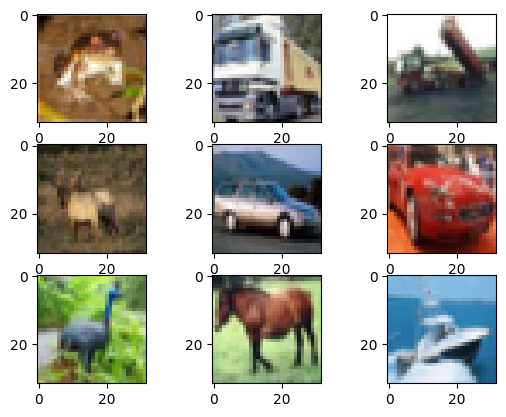

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

for temp in range(9):
    plt.subplot(3,3,temp+1)
    plt.imshow(X_train[temp])

In [ ]:
#이미지 전처리 scale
x_mean  = np.mean(X_train,axis=(0,1,2))
x_mean

array([125.30691805, 122.95039414, 113.86538318])

In [ ]:
x_std = np.std(X_train,axis=(0,1,2))
x_std

array([62.99321928, 62.08870764, 66.70489964])

In [ ]:
X_train = (X_train-x_mean) / x_std
X_test = (X_test-x_mean) / x_std

In [ ]:
X_train[0]

array([[[-1.05260405e+00, -9.81666336e-01, -7.62543433e-01],
        [-1.30659965e+00, -1.23936215e+00, -1.03238868e+00],
        [-1.19547658e+00, -1.20715017e+00, -1.06237148e+00],
        ...,
        [ 5.18993668e-01,  1.45752846e-01, -8.79303202e-02],
        [ 4.23745321e-01,  3.30109280e-02, -1.77878735e-01],
        [ 3.60246424e-01,  1.69049397e-02, -1.62887333e-01]],

       [[-1.73521721e+00, -1.65811785e+00, -1.40717374e+00],
        [-1.98921280e+00, -1.98023761e+00, -1.70700179e+00],
        [-1.70346776e+00, -1.85138971e+00, -1.70700179e+00],
        ...,
        [-3.66216884e-02, -5.62910640e-01, -8.82474653e-01],
        [-1.00120586e-01, -6.43440581e-01, -9.57431666e-01],
        [-5.24964129e-02, -5.79016628e-01, -8.52491848e-01]],

       [[-1.59234469e+00, -1.59369389e+00, -1.39218234e+00],
        [-1.73521721e+00, -1.86749569e+00, -1.70700179e+00],
        [-1.21135130e+00, -1.54537593e+00, -1.58707057e+00],
        ...,
        [-1.15995311e-01, -6.27334593e-01,

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.3,random_state=100)

In [ ]:
X_val.shape

(15000, 32, 32, 3)

In [ ]:
y_val.shape

(15000, 1)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Dense,Flatten,Dropout

model = Sequential()
model.add(Conv2D(32,3,padding='same',activation='relu',input_shape=(32,32,3)))
model.add(Conv2D(32,3,padding='same',activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='same'))
model.add(Conv2D(64,3,padding='same',activation='relu'))
model.add(Conv2D(64,3,padding='same',activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='same'))
model.add(Conv2D(128,3,padding='same',activation='relu'))
model.add(Conv2D(128,3,padding='same',activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='same'))
model.add(Flatten())
model.add(Dense(256,activation='relu'))
model.add(Dense(10,activation='softmax'))


model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 16, 16, 32)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 8, 8, 64)         0         
 2D)                                                    

In [ ]:
from tensorflow.keras.optimizers import Adam
import tensorflow as tf


model.compile(optimizer=Adam(5e-5),loss='sparse_categorical_crossentropy',metrics=['acc'])
history = model.fit(X_train,y_train,epochs=30,batch_size=32,validation_data=(X_val,y_val))

Epoch 1/30
1094/1094 [==============================] - 22s 9ms/step - loss: 1.7387 - acc: 0.3757 - val_loss: 1.5080 - val_acc: 0.4559
Epoch 2/30
1094/1094 [==============================] - 7s 7ms/step - loss: 1.4102 - acc: 0.4949 - val_loss: 1.3597 - val_acc: 0.5179
Epoch 3/30
1094/1094 [==============================] - 8s 7ms/step - loss: 1.2798 - acc: 0.5461 - val_loss: 1.2749 - val_acc: 0.5471
Epoch 4/30
1094/1094 [==============================] - 8s 7ms/step - loss: 1.1826 - acc: 0.5827 - val_loss: 1.1997 - val_acc: 0.5746
Epoch 5/30
1094/1094 [==============================] - 7s 7ms/step - loss: 1.0980 - acc: 0.6159 - val_loss: 1.1118 - val_acc: 0.6096
Epoch 6/30
1094/1094 [==============================] - 8s 7ms/step - loss: 1.0280 - acc: 0.6408 - val_loss: 1.0566 - val_acc: 0.6269
Epoch 7/30
1094/1094 [==============================] - 8s 7ms/step - loss: 0.9593 - acc: 0.6670 - val_loss: 1.0521 - val_acc: 0.6325
Epoch 8/30
1094/1094 [==============================] - 7s 7m

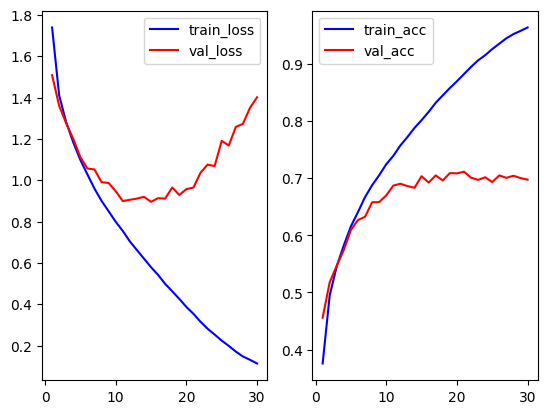

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['acc']
val_acc = history.history['val_acc']

plt.subplot(1,2,1)
plt.plot(range(1,len(train_loss)+1),train_loss,color='blue',label='train_loss')
plt.plot(range(1,len(train_loss)+1),val_loss,color='red',label='val_loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(1,len(train_loss)+1),train_acc,color='blue',label='train_acc')
plt.plot(range(1,len(train_loss)+1),val_acc,color='red',label='val_acc')
plt.legend()
plt.show()

In [ ]:
model.evaluate(X_test,y_test)

313/313 [==============================] - 1s 4ms/step - loss: 1.4486 - acc: 0.6949


[1.4486428499221802, 0.6948999762535095]

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Dense,Flatten,Dropout

model_d = Sequential()
model_d.add(Conv2D(32,3,padding='same',activation='relu',input_shape=(32,32,3)))
model_d.add(Conv2D(32,3,padding='same',activation='relu'))
model_d.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='same'))
model_d.add(Dropout(0.3))
model_d.add(Conv2D(64,3,padding='same',activation='relu'))
model_d.add(Conv2D(64,3,padding='same',activation='relu'))
model_d.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='same'))
model_d.add(Dropout(0.3))
model_d.add(Conv2D(128,3,padding='same',activation='relu'))
model_d.add(Conv2D(128,3,padding='same',activation='relu'))
model_d.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='same'))
model_d.add(Dropout(0.3))
model_d.add(Flatten())
model_d.add(Dense(256,activation='relu'))
model_d.add(Dense(10,activation='softmax'))


model_d.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 conv2d_7 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                                 
 conv2d_8 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 conv2d_9 (Conv2D)           (None, 16, 16, 64)        36928     
                                                      

In [ ]:
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor='val_loss', mode='min',patience=3)
model_d.compile(optimizer=Adam(1e-6),loss='sparse_categorical_crossentropy',metrics=['acc'])
history0_d = model_d.fit(X_train,y_train,epochs=50,batch_size=128,validation_data=(X_val,y_val),callbacks=[es])

Epoch 1/50
274/274 [==============================] - 9s 20ms/step - loss: 2.3086 - acc: 0.0993 - val_loss: 2.3017 - val_acc: 0.1145
Epoch 2/50
274/274 [==============================] - 5s 17ms/step - loss: 2.3025 - acc: 0.1067 - val_loss: 2.2990 - val_acc: 0.1299
Epoch 3/50
274/274 [==============================] - 5s 17ms/step - loss: 2.2993 - acc: 0.1100 - val_loss: 2.2964 - val_acc: 0.1335
Epoch 4/50
274/274 [==============================] - 5s 17ms/step - loss: 2.2961 - acc: 0.1168 - val_loss: 2.2937 - val_acc: 0.1337
Epoch 5/50
274/274 [==============================] - 5s 17ms/step - loss: 2.2922 - acc: 0.1203 - val_loss: 2.2904 - val_acc: 0.1342
Epoch 6/50
274/274 [==============================] - 5s 18ms/step - loss: 2.2884 - acc: 0.1245 - val_loss: 2.2862 - val_acc: 0.1477
Epoch 7/50
274/274 [==============================] - 5s 17ms/step - loss: 2.2831 - acc: 0.1309 - val_loss: 2.2805 - val_acc: 0.1596
Epoch 8/50
274/274 [==============================] - 5s 17ms/step - 

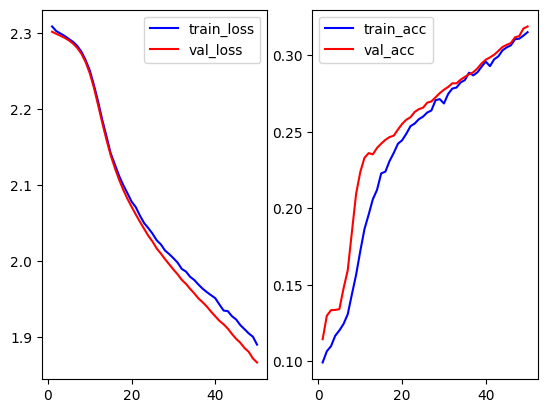

In [ ]:
train_loss = history0_d.history['loss']
val_loss = history0_d.history['val_loss']
train_acc = history0_d.history['acc']
val_acc = history0_d.history['val_acc']

plt.subplot(1,2,1)
plt.plot(range(1,len(train_loss)+1),train_loss,color='blue',label='train_loss')
plt.plot(range(1,len(train_loss)+1),val_loss,color='red',label='val_loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(1,len(train_loss)+1),train_acc,color='blue',label='train_acc')
plt.plot(range(1,len(train_loss)+1),val_acc,color='red',label='val_acc')
plt.legend()
plt.show()

In [ ]:
model_d.evaluate(X_test,y_test)

313/313 [==============================] - 1s 3ms/step - loss: 1.8565 - acc: 0.3275


[1.8565123081207275, 0.32749998569488525]

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 16, 16, 32)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 8, 8, 64)         0         
 2D)                                                    

In [ ]:
model.layers

AttributeError: ignored

In [ ]:
import tensorflow as tf

get_output = []

for layer in model.layers:
    get_output.append(layer.output)

layer_name = []
for layer in model.layers:
    layer_name.append(layer.name)

In [ ]:
X_train[0].shape

(32, 32, 3)

In [ ]:
test_img = np.reshape(X_train[0],(-1,32,32,3))
visual_model = tf.keras.models.Model(inputs = model.input , outputs=get_output)
feature_maps = visual_model.predict(test_img)

1/1 [==============================] - 0s 335ms/step


In [ ]:
feature_maps[0].shape

(1, 32, 32, 32)

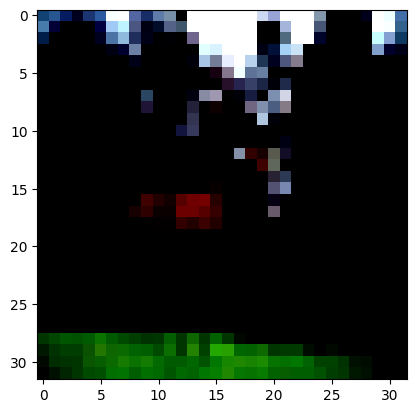

In [ ]:
plt.imshow(X_train[0])

<ipython-input-38-3b940ffa704e>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


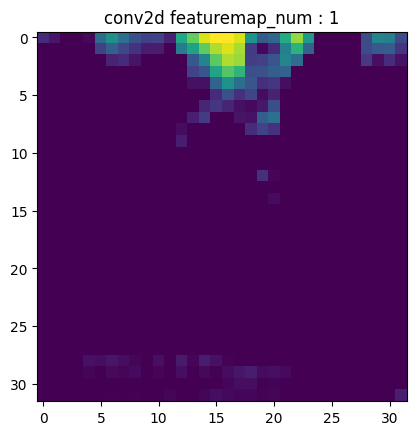

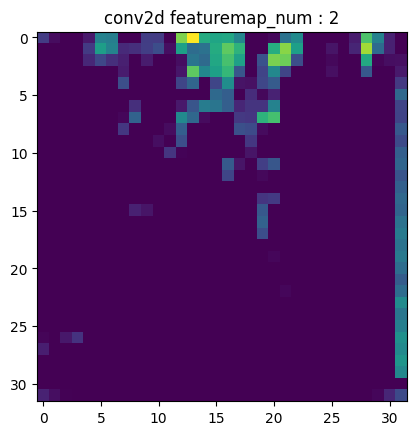

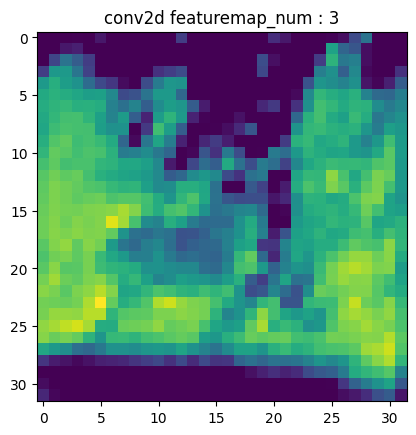

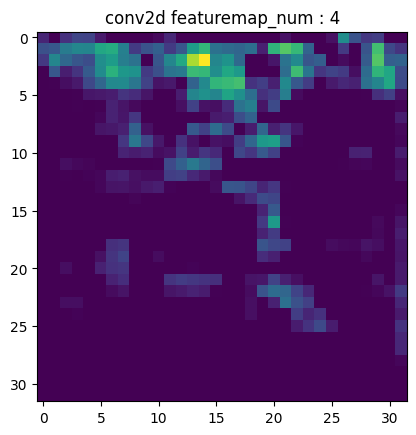

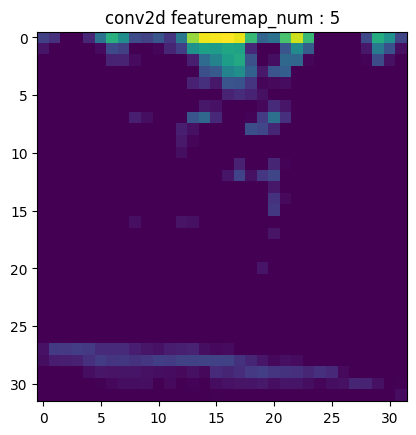

...

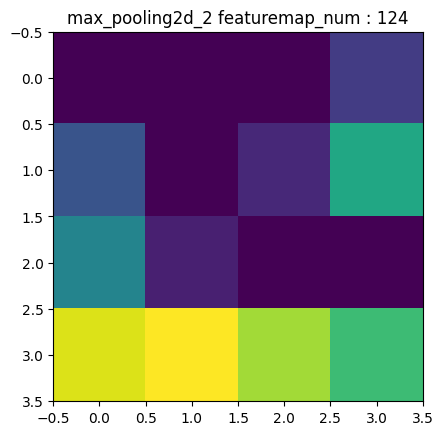

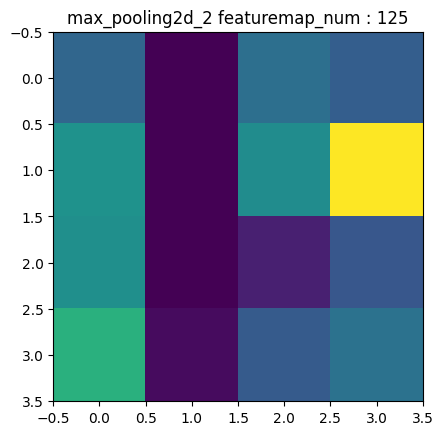

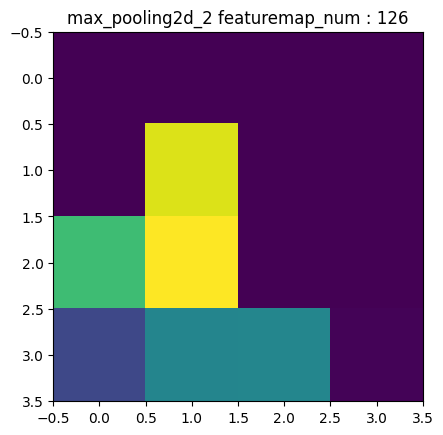

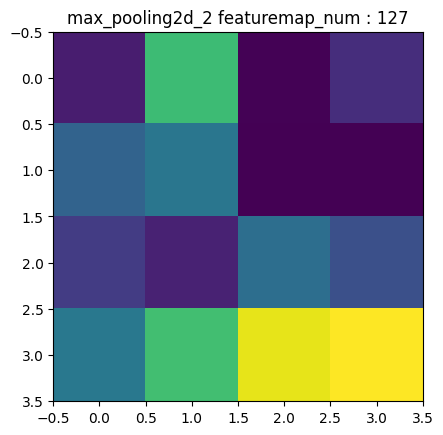

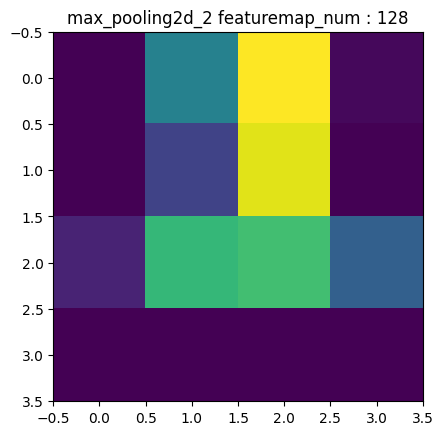

In [ ]:
for layer_name,feature_map in zip(layer_name,feature_maps):
    if(len(feature_map.shape)==4):
        img_size = feature_map.shape[1]
        feature_size = feature_map.shape[-1]

        for temp in range(feature_size):
            x = feature_map[0,:,:,temp]
            plt.figure()
            plt.title(f'{layer_name} featuremap_num : {temp+1}')
            plt.imshow(x,cmap='viridis')